# Web Scraping

In [3]:
#Downloading video and storing locally

from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import Select
import requests
import time
import os
import concurrent.futures

# Function to download a video
def download_video(video_url, word):
    try:
        # Download the video
        video_response = requests.get(video_url)

        if video_response.status_code == 200:
            # Save the video locally
            with open(f"videos/{word}.mp4", 'wb') as video_file:
                video_file.write(video_response.content)
            print(f"Video for '{word}' downloaded successfully.")
        else:
            print(f"Failed to download video for {word}. Status code: {video_response.status_code}")
    except Exception as e:
        print(f"Error downloading video for {word}: {str(e)}")

# Function to process each word
def process_word(option):
    word = option.text.strip()  # Get the word text
    print(f"Processing word: {word}")
    
    # Select the word in the dropdown
    select.select_by_visible_text(word)
    
    # Wait for the video to load (adjust if necessary)
    time.sleep(3)
    
    # Locate the <video> element in the "main-video" div
    video_element = driver.find_element(By.CSS_SELECTOR, '.main-video video')
    
    # Get the video URL from the 'src' attribute
    video_url = video_element.get_attribute('src')
    
    if video_url:
        print(f"Video URL: {video_url}")
        return video_url, word
    else:
        print(f"No video URL found for {word}")
        return None, word

# Set up Selenium WebDriver
driver = webdriver.Chrome()

# Open the webpage
url = 'https://cs.rkmvu.ac.in/~isl/'
driver.get(url)

# Wait for the page to load (adjust if necessary)
time.sleep(5)  # 5 is good 

# Locate the <select> element containing the word dictionary
select_element = driver.find_element(By.CSS_SELECTOR, 'select.videos')

# Create a Select object to interact with the dropdown
select = Select(select_element)

# Create a folder to save the videos if it doesn't exist
if not os.path.exists("videos"):
    os.makedirs("videos")

# List to store video URLs and corresponding words
video_tasks = []

# Loop through each option (word) in the dropdown
for option in select.options:
    video_url, word = process_word(option)
    if video_url:
        video_tasks.append((video_url, word))

# Close the Selenium driver
driver.quit()

# Use concurrent futures for parallel processing
with concurrent.futures.ThreadPoolExecutor() as executor:   #can add max_estimator as we want 
    # Submit download tasks to the executor
    futures = [executor.submit(download_video, video_url, word) for video_url, word in video_tasks]

    # Wait for all the tasks to complete
    for future in concurrent.futures.as_completed(futures):
        try:
            future.result()  # To raise exceptions if any occurred during download
        except Exception as exc:
            print(f"Generated an exception: {exc}")



Processing word: Address
Video URL: https://cs.rkmvu.ac.in/~isl/assets/videos/Address.mp4
Processing word: Baby
Video URL: https://cs.rkmvu.ac.in/~isl/assets/videos/Baby.mp4
Processing word: Birth
Video URL: https://cs.rkmvu.ac.in/~isl/assets/videos/Birth.mp4
Processing word: Boy
Video URL: https://cs.rkmvu.ac.in/~isl/assets/videos/Boy.mp4
Processing word: Brother
Video URL: https://cs.rkmvu.ac.in/~isl/assets/videos/Brother.mp4
Processing word: Brother-In-Law
Video URL: https://cs.rkmvu.ac.in/~isl/assets/videos/Brother-In-Law.mp4
Processing word: Children
Video URL: https://cs.rkmvu.ac.in/~isl/assets/videos/Children.mp4
Processing word: Daughter
Video URL: https://cs.rkmvu.ac.in/~isl/assets/videos/Daughter.mp4
Processing word: Enemy
Video URL: https://cs.rkmvu.ac.in/~isl/assets/videos/Enemy.mp4
Processing word: Engagement
Video URL: https://cs.rkmvu.ac.in/~isl/assets/videos/Engagement.mp4
Processing word: Family
Video URL: https://cs.rkmvu.ac.in/~isl/assets/videos/Family.mp4
Processing

# Extracting Landsmarks 

In [5]:
import cv2
import mediapipe as mp
import numpy as np
import os

# Initialize MediaPipe face and hands detector
mp_face_mesh = mp.solutions.face_mesh
mp_hands = mp.solutions.hands
mp_drawing = mp.solutions.drawing_utils

# Directories for videos and landmarks
video_dir = "New Folder"  # Path to your directory with multiple folders containing videos
output_face_landmarks_dir = "path_to_face_landmarks_output"  # Directory to store face landmarks
output_hand_landmarks_dir = "path_to_hand_landmarks_output"  # Directory to store hand landmarks

# Create output directories if they don't exist
os.makedirs(output_face_landmarks_dir, exist_ok=True)
os.makedirs(output_hand_landmarks_dir, exist_ok=True)

# Function to process and extract face and hand landmarks from videos
def process_video(video_path, face_landmarks_path, hand_landmarks_path):
    # Capture video
    cap = cv2.VideoCapture(video_path)
    
    # Initialize MediaPipe models
    with mp_face_mesh.FaceMesh(static_image_mode=False, max_num_faces=1, min_detection_confidence=0.4) as face_mesh, \
         mp_hands.Hands(static_image_mode=False, max_num_hands=2, min_detection_confidence=0.4, min_tracking_confidence=0.4) as hands:

        face_landmarks_list = []
        hand_landmarks_list = []

        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break

            # Convert frame to RGB (MediaPipe expects RGB)
            rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

            # Detect face landmarks
            face_results = face_mesh.process(rgb_frame)
            if face_results.multi_face_landmarks:
                for face_landmarks in face_results.multi_face_landmarks:
                    # Save face landmarks
                    face_landmarks_list.append(np.array([(lm.x, lm.y, lm.z) for lm in face_landmarks.landmark]))

            # Detect hand landmarks
            hand_results = hands.process(rgb_frame)
            if hand_results.multi_hand_landmarks:
                for hand_landmarks in hand_results.multi_hand_landmarks:
                    # Save hand landmarks
                    hand_landmarks_list.append(np.array([(lm.x, lm.y, lm.z) for lm in hand_landmarks.landmark]))

        # Release the video capture object
        cap.release()

        # Save landmarks to respective directories in NumPy format
        if face_landmarks_list:
            save_landmarks_as_numpy(face_landmarks_list, face_landmarks_path)
        if hand_landmarks_list:
            save_landmarks_as_numpy(hand_landmarks_list, hand_landmarks_path)

# Function to save landmarks to a NumPy file
def save_landmarks_as_numpy(landmarks_list, output_path):
    np.save(output_path, np.array(landmarks_list))  # Save the list of landmarks as a NumPy array

# Process each video in a single directory
for video_name in os.listdir(video_dir):
    if video_name.endswith(('.mp4', '.avi', '.mkv', '.mov', '.flv')):  # Check if it is a video file
        video_path = os.path.join(video_dir, video_name)

        # Generate paths to save landmarks as NumPy files
        face_landmarks_output_path = os.path.join(output_face_landmarks_dir, f"{video_name}_face_landmarks.npy")
        hand_landmarks_output_path = os.path.join(output_hand_landmarks_dir, f"{video_name}_hand_landmarks.npy")

        # Process each video
        process_video(video_path, face_landmarks_output_path, hand_landmarks_output_path)


print("Processing complete!")


Processing complete!


Checking landmarks shape

In [6]:
import numpy as np

# Load saved landmarks
face_landmarks = np.load("path_to_face_landmarks_output/Appreciate.mp4_face_landmarks.npy")
hand_landmarks = np.load("path_to_hand_landmarks_output/Appreciate.mp4_hand_landmarks.npy")

print(face_landmarks.shape)
print(hand_landmarks.shape)


(88, 468, 3)
(175, 21, 3)


In [19]:
face_landmarks[0]

array([[ 0.51063812,  0.2869525 , -0.01684029],
       [ 0.5094344 ,  0.2708776 , -0.03025088],
       [ 0.51019394,  0.27658895, -0.01755682],
       ...,
       [ 0.52060366,  0.2470454 , -0.00195191],
       [ 0.55062091,  0.24662715,  0.00941402],
       [ 0.55302823,  0.24581778,  0.00959324]])

#### Extracting frame and landmarks
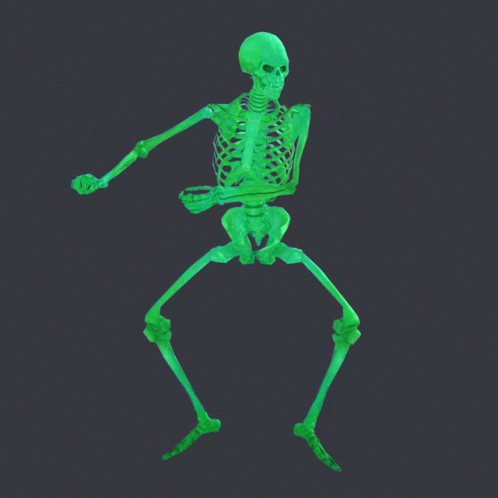

1. Face Landmarks: 
* If __no face landmarks__ are detected, an array filled with zeros of shape (468, 3) (for 468 face landmarks, each with 3 coordinates) is saved.0️⃣0️⃣0️⃣0️⃣0️⃣

2. Hand Landmarks:

* If __both hands are not detected__, skip that frame entirely.❌❌❌❌❌❌
* If __only one hand__ is detected (either left or right), replace the missing hand's landmarks with zeros of shape (21, 3) (for 21 hand landmarks).0️⃣0️⃣0️⃣0️⃣0️⃣|

In [ ]:
import cv2
import mediapipe as mp
import numpy as np
import os

# Initialize Mediapipe modules
mp_face_mesh = mp.solutions.face_mesh
mp_hands = mp.solutions.hands

def extract_landmarks(frame, face_mesh, hands):
    """
    Extract face and hand landmarks from a frame.
    
    Args:
    frame (np.ndarray): Image frame from which to extract landmarks.
    face_mesh: Mediapipe FaceMesh object.
    hands: Mediapipe Hands object.
    
    Returns:
    tuple: Face landmarks, left hand landmarks, and right hand landmarks as NumPy arrays.
    """
    face_landmarks = []
    left_hand_landmarks = np.zeros((21, 3))  # Placeholder for left hand
    right_hand_landmarks = np.zeros((21, 3))  # Placeholder for right hand

    # Convert the frame to RGB 
    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    rgb_frame.flags.writeable = False

    # Detect face landmarks
    face_results = face_mesh.process(rgb_frame)
    if face_results.multi_face_landmarks:
        for face_landmark in face_results.multi_face_landmarks:
            face_landmarks.append([[lm.x, lm.y, lm.z] for lm in face_landmark.landmark])

    # Detect hand landmarks
    hand_results = hands.process(rgb_frame)
    if hand_results.multi_hand_landmarks:
        for idx, hand_landmark in enumerate(hand_results.multi_hand_landmarks):
            handedness = hand_results.multi_handedness[idx].classification[0].label
            if handedness == 'Left':
                left_hand_landmarks = np.array([[lm.x, lm.y, lm.z] for lm in hand_landmark.landmark])
            elif handedness == 'Right':
                right_hand_landmarks = np.array([[lm.x, lm.y, lm.z] for lm in hand_landmark.landmark])
    
    return np.array(face_landmarks), left_hand_landmarks, right_hand_landmarks

def process_videos(videos_base_directory, landmarks_base_directory):
    """
    Process each video to extract face and hand landmarks for each frame, then save them as NumPy arrays in subdirectories
    named after the video files.
    
    Args:
    videos_base_directory (str): Directory containing videos.
    landmarks_base_directory (str): Base directory to save landmarks as NumPy arrays.
    """
    with mp_face_mesh.FaceMesh(max_num_faces=1) as face_mesh, mp_hands.Hands(max_num_hands=2) as hands:
        for video_file in os.listdir(videos_base_directory):
            # Ensure we are processing video files only
            if video_file.endswith(('.mp4', '.avi')):
                video_path = os.path.join(videos_base_directory, video_file)
                video_capture = cv2.VideoCapture(video_path)  #taking video one by one

                frame_count = 0

                # Create subdirectory for the current video
                base_filename = os.path.splitext(video_file)[0]
                video_landmarks_directory = os.path.join(landmarks_base_directory, base_filename)
                
                face_landmarks_directory = os.path.join(video_landmarks_directory, "face_landmarks")
                hand_landmarks_directory = os.path.join(video_landmarks_directory, "hand_landmarks")
                left_hand_landmarks_directory = os.path.join(video_landmarks_directory, "left_hand_landmarks")
                right_hand_landmarks_directory = os.path.join(video_landmarks_directory, "right_hand_landmarks")
                
                # Ensure directories exist
                os.makedirs(face_landmarks_directory, exist_ok=True)
                os.makedirs(hand_landmarks_directory, exist_ok=True)
                os.makedirs(left_hand_landmarks_directory, exist_ok=True)
                os.makedirs(right_hand_landmarks_directory, exist_ok=True)

                while True:
                    ret, frame = video_capture.read()
                    if not ret:
                        break  # End of video

                    frame_count += 1

                    # Extract face and hand landmarks
                    face_landmarks, left_hand_landmarks, right_hand_landmarks = extract_landmarks(frame, face_mesh, hands)

                    # Check if landmarks were detected before saving
                    if face_landmarks.size == 0 and np.all(left_hand_landmarks == 0) and np.all(right_hand_landmarks == 0):
                        print(f"No landmarks detected in frame {frame_count} of {video_file}. Skipping...")
                        continue

                    # Save landmarks as NumPy arrays
                    if face_landmarks.size > 0:
                        np.save(os.path.join(face_landmarks_directory, f"frame{frame_count}_face_landmarks.npy"), face_landmarks)
                        print(f"Saved face landmarks for frame {frame_count} of {video_file}")
                    
                    # Combine left and right hand landmarks into one array of shape (2, 21, 3) must have
                    combined_hand_landmarks = np.array([left_hand_landmarks, right_hand_landmarks])
                    
                    # Save combined, left and right hand landmarks (zero-filled if missing)
                    np.save(os.path.join(hand_landmarks_directory, f"frame{frame_count}_hand_landmarks.npy"), combined_hand_landmarks)
                    np.save(os.path.join(left_hand_landmarks_directory, f"frame{frame_count}_left_hand_landmarks.npy"), left_hand_landmarks)
                    np.save(os.path.join(right_hand_landmarks_directory, f"frame{frame_count}_right_hand_landmarks.npy"), right_hand_landmarks)
                    print(f"Saved hand landmarks for frame {frame_count} of {video_file}")

                video_capture.release()

# Local Directory
videos_base_directory = "videos" 
landmarks_base_directory = "landmarks"

process_videos(videos_base_directory, landmarks_base_directory)


Saved face landmarks for frame 1 of A.C..mp4
Saved hand landmarks for frame 1 of A.C..mp4
Saved face landmarks for frame 2 of A.C..mp4
Saved hand landmarks for frame 2 of A.C..mp4
Saved face landmarks for frame 3 of A.C..mp4
Saved hand landmarks for frame 3 of A.C..mp4
Saved face landmarks for frame 4 of A.C..mp4
Saved hand landmarks for frame 4 of A.C..mp4
Saved face landmarks for frame 5 of A.C..mp4
Saved hand landmarks for frame 5 of A.C..mp4
Saved face landmarks for frame 6 of A.C..mp4
Saved hand landmarks for frame 6 of A.C..mp4
Saved face landmarks for frame 7 of A.C..mp4
Saved hand landmarks for frame 7 of A.C..mp4
Saved face landmarks for frame 8 of A.C..mp4
Saved hand landmarks for frame 8 of A.C..mp4
Saved face landmarks for frame 9 of A.C..mp4
Saved hand landmarks for frame 9 of A.C..mp4
Saved face landmarks for frame 10 of A.C..mp4
Saved hand landmarks for frame 10 of A.C..mp4
Saved face landmarks for frame 11 of A.C..mp4
Saved hand landmarks for frame 11 of A.C..mp4
Saved 

Getting shape of landmarks for particular frame.

In [34]:
import os
import numpy as np

def print_first_frame_landmark_shapes(landmarks_directory):
    """
    Print the shape of the first frame's landmarks for all subdirectories in the given directory.
    
    Args:
    landmarks_directory (str): Path to the directory containing subdirectories with landmarks .npy files.
    """
    print(f"📂📂 Landmarks in {landmarks_directory} 📂📂")
    
    # Iterate through subdirectories in landmarks_directory
    for subdirectory in os.listdir(landmarks_directory):
        subdir_path = os.path.join(landmarks_directory, subdirectory)
        
        # Only proceed if the item is a directory
        if os.path.isdir(subdir_path):
            print(f"\n{subdirectory.capitalize()}...")
            
            # List all .npy files in the subdirectory
            npy_files = [f for f in os.listdir(subdir_path) if f.endswith('.npy')]
            
            if npy_files:
                # Sort the files to ensure the first frame is chosen (if filenames are frame-based)
                npy_files.sort()

                # Load the first file
                first_file_path = os.path.join(subdir_path, npy_files[4])   # can be changed position as we want
                landmarks = np.load(first_file_path)

                # Print the shape of the landmarks in the first frame
                print(f"First frame landmarks shape: {landmarks.shape}")
                print(f"{landmarks}")
                print("🎊" * 20)
            else:
                print(f"No .npy files found in {subdirectory}")
    

landmarks_directory = r"landmarks\Zoom Meeting"   # for our chosen word video landmark
print_first_frame_landmark_shapes(landmarks_directory)


📂📂 Landmarks in landmarks\Zoom Meeting 📂📂

Face_landmarks...
First frame landmarks shape: (1, 468, 3)
[[[ 0.49811354  0.28449047 -0.01383838]
  [ 0.49858442  0.27159575 -0.02918536]
  [ 0.49841648  0.27574152 -0.01504044]
  ...
  [ 0.5082047   0.24843571 -0.00453801]
  [ 0.53720272  0.24554668  0.00628123]
  [ 0.53976274  0.24513173  0.00634798]]]
🎊🎊🎊🎊🎊🎊🎊🎊🎊🎊🎊🎊🎊🎊🎊🎊🎊🎊🎊🎊

Hand_landmarks...
First frame landmarks shape: (2, 21, 3)
[[[ 3.06577206e-01  7.58954823e-01 -8.56621085e-08]
  [ 3.34340841e-01  7.66812563e-01 -7.90146738e-03]
  [ 3.51424843e-01  7.87170649e-01 -1.15279602e-02]
  [ 3.59866112e-01  8.07271481e-01 -1.31908571e-02]
  [ 3.67622674e-01  8.22639763e-01 -1.36173386e-02]
  [ 3.27144980e-01  8.05926204e-01 -1.55971553e-02]
  [ 3.42725694e-01  8.34442914e-01 -2.14178395e-02]
  [ 3.56052846e-01  8.44599903e-01 -2.33773552e-02]
  [ 3.65411252e-01  8.49170744e-01 -2.32087858e-02]
  [ 3.10205877e-01  8.09406757e-01 -1.28269307e-02]
  [ 3.28128755e-01  8.37736547e-01 -1.71646029e-02

Displaying frame landmarks numpy arrray shape for each frame.

In [22]:
import os
import numpy as np

def print_first_frame_landmark_shapes(landmarks_directory):
    """
    Print the shape of the first frame's landmarks for all subdirectories in the given directory.
    
    Args:
    landmarks_directory (str): Path to the directory containing subdirectories with landmarks .npy files.
    """
    print(f"📂📂 Landmarks in {landmarks_directory} 📂📂")
    
    # Iterate through subdirectories in landmarks_directory
    for subdirectory in os.listdir(landmarks_directory):
        subdir_path = os.path.join(landmarks_directory, subdirectory)
        
        # Only proceed if the item is a directory
        if os.path.isdir(subdir_path):
            print(f"\n{subdirectory.capitalize()}...")
            
            # List all .npy files in the subdirectory
            npy_files = [f for f in os.listdir(subdir_path) if f.endswith('.npy')]
            
            if npy_files:
                # Sort the files to ensure the first frame is chosen (if filenames are frame-based)
                npy_files.sort()

                for file in npy_files:
                    file_path = os.path.join(subdir_path, file)
                    landmarks = np.load(file_path)

                # Print the shape of the landmarks in the first frame
                    print(f"Frame landmarks shape: {landmarks.shape}")
                
                print("🎊" * 20)
            else:
                print(f"No .npy files found in {subdirectory}")
    

landmarks_directory = r"landmarks\Zoom Meeting"   # for our chosen word video landmark
print_first_frame_landmark_shapes(landmarks_directory)


📂📂 Landmarks in landmarks\Zoom Meeting 📂📂

Face_landmarks...
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 468, 3)
Frame landmarks shape: (1, 46

Removing hand_landmarks directory from each word. (For combining landmarks)

In [1]:
import os
import shutil

def remove(landmarks_directory):
    print(f"📂📂 Removing landmarks from {landmarks_directory} 📂📂")

    # Iterate through each subdirectory (e.g., video name directories)
    for video_folder in os.listdir(landmarks_directory):
        video_path = os.path.join(landmarks_directory, video_folder)
        
        if os.path.isdir(video_path):
            print(f"\nProcessing video folder: {video_folder}...")


            # Iterate through subdirectories inside each video folder (e.g., face, left_hand, right_hand)
            for subdirectory in os.listdir(video_path):
                if subdirectory == "hand_landmarks":
                    subdir_path = os.path.join(video_path, subdirectory)
    
                    # Only proceed if the item is a directory (e.g., face, left_hand, right_hand)
                    if os.path.isdir(subdir_path):
                            if os.path.exists(subdir_path):
                                # Use shutil.rmtree to remove the directory and its contents
                                shutil.rmtree(subdir_path)
                                print(f"Directory '{subdir_path}' and its contents have been removed.")
                            else:
                                print(f"Directory '{subdir_path}' does not exist.")

                   

# Example usage
landmarks_directory = "landmarks"  # Path to your landmark subdirectories (each subdirectory is a video folder)
remove(landmarks_directory)


📂📂 Removing landmarks from landmarks 📂📂

Processing video folder: A...
Directory 'landmarks\A\hand_landmarks' and its contents have been removed.

Processing video folder: A.C...
Directory 'landmarks\A.C\hand_landmarks' and its contents have been removed.

Processing video folder: A.T.M. (Machine)...
Directory 'landmarks\A.T.M. (Machine)\hand_landmarks' and its contents have been removed.

Processing video folder: A.T.M. Card...
Directory 'landmarks\A.T.M. Card\hand_landmarks' and its contents have been removed.

Processing video folder: Aadhar Card...
Directory 'landmarks\Aadhar Card\hand_landmarks' and its contents have been removed.

Processing video folder: About...
Directory 'landmarks\About\hand_landmarks' and its contents have been removed.

Processing video folder: Above...
Directory 'landmarks\Above\hand_landmarks' and its contents have been removed.

Processing video folder: Absent...
Directory 'landmarks\Absent\hand_landmarks' and its contents have been removed.

Processing 

Combining landmarks(face, left, right) and saving in different directory.

In [2]:
import os
import numpy as np

def combine_and_save_landmarks(landmarks_directory, output_directory):
    """
    Combine landmarks for each subdirectory (face, left hand, right hand) and save them as numpy arrays.
    
    Args:
    landmarks_directory (str): Path to the directory containing subdirectories with landmarks .npy files.
    output_directory (str): Path to the directory where the combined landmark files will be saved.
    """
    print(f"📂📂 Combining landmarks from {landmarks_directory} 📂📂")

    # Ensure the output directory exists
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)

    # Iterate through each subdirectory (e.g., video name directories)
    for video_folder in os.listdir(landmarks_directory):
        video_path = os.path.join(landmarks_directory, video_folder)
        
        if os.path.isdir(video_path):
            print(f"\nProcessing video folder: {video_folder}...")

            # Initialize a dictionary to store the landmarks from each subdirectory (face, left_hand, right_hand)
            all_landmarks = {}

            # Iterate through subdirectories inside each video folder (e.g., face, left_hand, right_hand)
            for subdirectory in os.listdir(video_path):
                subdir_path = os.path.join(video_path, subdirectory)

                # Only proceed if the item is a directory (e.g., face, left_hand, right_hand)
                if os.path.isdir(subdir_path):
                    print(f"Loading landmarks from {subdirectory.capitalize()}...")

                    # List all .npy files in the subdirectory
                    npy_files = [f for f in os.listdir(subdir_path) if f.endswith('.npy')]

                    if npy_files:
                        # Sort the files to ensure the frame order
                        npy_files.sort()

                        # Load all frames' landmarks from this subdirectory
                        landmarks_list = []
                        for file in npy_files:
                            file_path = os.path.join(subdir_path, file)
                            landmarks = np.load(file_path)

                            if "_face_" in file:
                                # Reshape each landmarks array (1, 468, 3) -> (468, 3)
                                reshaped_landmarks = landmarks.reshape(468, 3)
                                landmarks_list.append(reshaped_landmarks)
                            else:
                                # Append hand or other landmarks as-is
                                landmarks_list.append(landmarks)

                        if landmarks_list:
                            # Save landmarks of this subdirectory in the dictionary
                            all_landmarks[subdirectory] = np.array(landmarks_list)
                    else:
                        print(f"No .npy files found in {subdirectory}.")

            # Now combine the landmarks from face, left_hand, right_hand, etc., frame by frame
            combined_landmarks = []
            
            # Assuming all subdirectories have the same number of frames
            num_frames = len(list(all_landmarks.values())[0])

            for frame_idx in range(num_frames):
                combined_frame = []
                
                # Combine landmarks for each landmark type (face, left_hand, right_hand) for this frame
                for landmark_type, landmarks in all_landmarks.items():
                    combined_frame.append(landmarks[frame_idx])  # Add landmarks for this frame

                # Ensure all arrays are 2D before concatenation
                combined_frame = [frame.reshape(-1, 3) for frame in combined_frame]
                
                # Combine all landmarks into one array for this frame
                combined_frame = np.concatenate(combined_frame, axis=0)
                combined_landmarks.append(combined_frame)
            
            # Convert the list of combined landmarks to a NumPy array
            combined_landmarks = np.array(combined_landmarks)

            # Create the corresponding output subdirectory in the output directory
            output_subdir = os.path.join(output_directory, video_folder)
            os.makedirs(output_subdir, exist_ok=True)

            # Save the combined landmarks in the output subdirectory
            output_file = os.path.join(output_subdir, "combined_landmarks.npy")
            np.save(output_file, combined_landmarks)

            print(f"Combined landmarks saved to {output_file}")
            print(f"Shape of combined landmarks: {combined_landmarks.shape}")

# Example usage
landmarks_directory = "landmarks"  # Path to your landmark subdirectories (each subdirectory is a video folder)
output_directory = "Combined"  # Directory to save the combined landmarks
combine_and_save_landmarks(landmarks_directory, output_directory)


📂📂 Combining landmarks from landmarks 📂📂

Processing video folder: A...
Loading landmarks from Face_landmarks...
Loading landmarks from Left_hand_landmarks...
Loading landmarks from Right_hand_landmarks...
Combined landmarks saved to Combined\A\combined_landmarks.npy
Shape of combined landmarks: (90, 510, 3)

Processing video folder: A.C...
Loading landmarks from Face_landmarks...
Loading landmarks from Left_hand_landmarks...
Loading landmarks from Right_hand_landmarks...
Combined landmarks saved to Combined\A.C\combined_landmarks.npy
Shape of combined landmarks: (105, 510, 3)

Processing video folder: A.T.M. (Machine)...
Loading landmarks from Face_landmarks...
Loading landmarks from Left_hand_landmarks...
Loading landmarks from Right_hand_landmarks...
Combined landmarks saved to Combined\A.T.M. (Machine)\combined_landmarks.npy
Shape of combined landmarks: (135, 510, 3)

Processing video folder: A.T.M. Card...
Loading landmarks from Face_landmarks...
Loading landmarks from Left_hand_l

** Video has same green background. We have to change (light condition , brightness)**

In [212]:
import numpy as np
(np.load("Combined/A/combined_landmarks.npy")).shape

(90, 510, 3)

In [218]:
import numpy as np
a=np.load("Combined/A/combined_landmarks.npy")

a[0]

array([[ 4.88428563e-01,  2.77603507e-01, -1.67188179e-02],
       [ 4.88474548e-01,  2.63850510e-01, -2.89453957e-02],
       [ 4.88609463e-01,  2.68810689e-01, -1.61788706e-02],
       ...,
       [ 6.47946060e-01,  8.24495137e-01, -3.78019200e-03],
       [ 6.34531081e-01,  8.30520213e-01, -2.15805182e-03],
       [ 6.24120653e-01,  8.30893517e-01, -8.75710102e-05]])

Reshaping the combined landmarks (num_frame, num_of_landmarks, coordinates) ---> (num_frame, num_of_landmarks, coordinates)

In [8]:
import numpy as np
import os

def reshape_and_save_numpy_array(combined_directory, output_directory):
    # Ensure the output directory exists
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)

    for video_folder in os.listdir(combined_directory):
        video_path = os.path.join(combined_directory, video_folder)
        
        # Create corresponding output folder
        output_folder = os.path.join(output_directory, video_folder)
        if not os.path.exists(output_folder):
            os.makedirs(output_folder)

        # Iterate over the .npy files inside the video folder
        for video_file in os.listdir(video_path):
            subdir_path = os.path.join(video_path, video_file)
            if subdir_path.endswith('.npy'):
                # Load the combined landmarks numpy array
                combined_landmarks = np.load(subdir_path)
                print(f"Processing: {subdir_path}")
                
                # Reshape the array (flattening per frame)
                reshaped_landmarks = combined_landmarks.reshape(combined_landmarks.shape[0], -1)
                print(f"Original shape: {combined_landmarks.shape} -> Reshaped to: {reshaped_landmarks.shape}")
                
                # Save reshaped landmarks in the output directory under the same video folder
                output_file = os.path.join(output_folder, video_file)  # Use same .npy filename
                np.save(output_file, reshaped_landmarks)
                print(f"Saved reshaped landmarks to: {output_file}")

combined_directory = "Combined"  # Directory with original combined landmarks
output_directory = "Reshaped_Combined"    # Directory to save reshaped landmarks
reshape_and_save_numpy_array(combined_directory, output_directory)


Processing: Combined\A\combined_landmarks.npy
Original shape: (90, 510, 3) -> Reshaped to: (90, 1530)
Saved reshaped landmarks to: Reshaped_Combined\A\combined_landmarks.npy
Processing: Combined\A.C\combined_landmarks.npy
Original shape: (105, 510, 3) -> Reshaped to: (105, 1530)
Saved reshaped landmarks to: Reshaped_Combined\A.C\combined_landmarks.npy
Processing: Combined\A.T.M. (Machine)\combined_landmarks.npy
Original shape: (135, 510, 3) -> Reshaped to: (135, 1530)
Saved reshaped landmarks to: Reshaped_Combined\A.T.M. (Machine)\combined_landmarks.npy
Processing: Combined\A.T.M. Card\combined_landmarks.npy
Original shape: (135, 510, 3) -> Reshaped to: (135, 1530)
Saved reshaped landmarks to: Reshaped_Combined\A.T.M. Card\combined_landmarks.npy
Processing: Combined\Aadhar Card\combined_landmarks.npy
Original shape: (90, 510, 3) -> Reshaped to: (90, 1530)
Saved reshaped landmarks to: Reshaped_Combined\Aadhar Card\combined_landmarks.npy
Processing: Combined\About\combined_landmarks.npy


### Training lstm (Older Version- Has simple code)

Data Augmentation and saving in different argument

In [1]:
import os
import numpy as np

def augment_landmarks(landmarks, num_augmentations=100, max_noise=0.05, max_shift=2.0, max_scale=0.05, max_rotation=5.0):
    augmented_data = []

    for _ in range(num_augmentations):
        # Add small random noise
        noisy_landmarks = landmarks + np.random.normal(0, max_noise, landmarks.shape)

        # Apply scaling
        scale_factor = np.random.uniform(1 - max_scale, 1 + max_scale)
        scaled_landmarks = noisy_landmarks * scale_factor

        # Apply rotation around Z-axis if landmarks have (x, y, z) format
        if scaled_landmarks.shape[1] % 3 == 0:
            num_landmarks = scaled_landmarks.shape[1] // 3
            rotated_landmarks = scaled_landmarks.copy()
            angle = np.radians(np.random.uniform(-max_rotation, max_rotation))
            cos_val, sin_val = np.cos(angle), np.sin(angle)

            for i in range(num_landmarks):
                x = scaled_landmarks[:, i * 3]
                y = scaled_landmarks[:, i * 3 + 1]
                
                # Rotate x and y
                rotated_x = cos_val * x - sin_val * y
                rotated_y = sin_val * x + cos_val * y

                rotated_landmarks[:, i * 3] = rotated_x
                rotated_landmarks[:, i * 3 + 1] = rotated_y
        else:
            rotated_landmarks = scaled_landmarks

        # Apply shift
        shift = np.random.uniform(-max_shift, max_shift, rotated_landmarks.shape[1])
        shifted_landmarks = rotated_landmarks + shift

        # Append the final augmented data
        augmented_data.append(shifted_landmarks)
        print("Augmented array shape:", shifted_landmarks.shape)

    return augmented_data

# Paths
data_dir = 'New Folder'           # Directory where original landmarks are saved
augmented_dir = 'Augmented_Combined'  # Directory where augmented data will be saved

# Ensure the augmented directory exists
os.makedirs(augmented_dir, exist_ok=True)

# Load data, augment, and save
for folder_name in os.listdir(data_dir):
    folder_path = os.path.join(data_dir, folder_name)
    augmented_folder_path = os.path.join(augmented_dir, folder_name)
    
    # Create corresponding folder in augmented directory if it doesn't exist
    os.makedirs(augmented_folder_path, exist_ok=True)
    
    if os.path.isdir(folder_path):
        for file_name in os.listdir(folder_path):
            if file_name.endswith('.npy'):
                file_path = os.path.join(folder_path, file_name)
                landmarks = np.load(file_path)  # Load original landmarks

                # Save the original landmarks to the augmented directory
                original_file_path = os.path.join(augmented_folder_path, f"{file_name.split('.')[0]}.npy")
                np.save(original_file_path, landmarks)
                print(f"Saved original: {original_file_path}")
                
                # Generate augmentations
                augmented_landmarks_list = augment_landmarks(landmarks)
                
                # Save each augmented array
                for i, augmented_landmarks in enumerate(augmented_landmarks_list):
                    augmented_file_path = os.path.join(augmented_folder_path, f"{file_name.split('.')[0]}_aug{i+1}.npy")
                    np.save(augmented_file_path, augmented_landmarks)
                    print(f"Saved: {augmented_file_path}")

print("Data augmentation completed and saved in", augmented_dir)


Saved original: Augmented_Combined2\A\combined_landmarks.npy
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape: (90, 1530)
Augmented array shape

Each array should be padded and masked then feed to model.

In [2]:
import os
import numpy as np
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Masking
from sklearn.preprocessing import LabelEncoder

# Parameters
data_dir = 'Augmented_Combined'  # Directory where reshaped landmarks are saved

# Data storage lists
X_data = []
y_labels = []

num_of_frame=[]

verify_data=[]
verify_label=[]
# Load data and labels
for folder_name in os.listdir(data_dir):
    folder_path = os.path.join(data_dir, folder_name)
    if os.path.isdir(folder_path):
        label = folder_name  # Use the folder name as the label
        for file_name in os.listdir(folder_path):
            if file_name.endswith('.npy'):
                file_path = os.path.join(folder_path, file_name)
                
                # Load the .npy file and verify its shape
                data = np.load(file_path)
                num_of_frame.append(len(data))
                verify_data.append(data[0])             # Append landmark data
                verify_label.append(label)          # Append corresponding label
                
                X_data.append(data)             # Append landmark data
                y_labels.append(label)          # Append corresponding label



In [3]:
X_data[0].shape

(90, 1530)

In [4]:
verify_data[0]

array([ 4.88428563e-01,  2.77603507e-01, -1.67188179e-02, ...,
        6.24120653e-01,  8.30893517e-01, -8.75710102e-05])

In [5]:
verify_label[0]

'A'

In [6]:
path='New Folder/A/combined_landmarks.npy'
data = np.load(path)
print(data[0]) 

[ 4.88428563e-01  2.77603507e-01 -1.67188179e-02 ...  6.24120653e-01
  8.30893517e-01 -8.75710102e-05]


Verfied labels are associated with its data. ✅✅✅✅✅✅✅✅

In [7]:
max(num_of_frame)

165

In [8]:
len(X_data)

1919

In [9]:
len(y_labels)

1919

Padding and encoding labels

In [10]:
max_timesteps = max(num_of_frame)   # Set to the max frames found in your data for padding
n_features = 1530                   # Number of features per frame
n_classes =  len(X_data)            # Update this according to the total unique labels
batch_size=32
# Pad sequences
X_padded = pad_sequences(X_data, maxlen=max_timesteps, dtype='float32', padding='post')

# Encode labels to integers
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y_labels)
y_categorical = to_categorical(y_encoded, num_classes=len(label_encoder.classes_))

#Save the label encoder classes as a numpy file
np.save('label_classes.npy', label_encoder.classes_)

# To check the shape of y_categorical
print("Shape of one-hot encoded labels:", y_categorical.shape)
print("Number of classes:", len(label_encoder.classes_))


print(X_padded.shape)
print(y_categorical.shape)


Shape of one-hot encoded labels: (1919, 19)
Number of classes: 19
(1919, 165, 1530)
(1919, 19)


In [11]:
X_padded[0]

array([[ 4.8842856e-01,  2.7760351e-01, -1.6718818e-02, ...,
         6.2412065e-01,  8.3089352e-01, -8.7571010e-05],
       [ 4.8855340e-01,  2.7758926e-01, -1.6688444e-02, ...,
         6.2455934e-01,  8.2905877e-01,  2.0965689e-04],
       [ 4.8837471e-01,  2.7758998e-01, -1.6604528e-02, ...,
         6.2252748e-01,  8.2494932e-01, -3.2703353e-03],
       ...,
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00]], dtype=float32)

In [12]:
X_padded.shape

(1919, 165, 1530)

In [13]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Masking
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping

# Define LSTM model with Masking and regularization
model = Sequential()
model.add(Masking(mask_value=0.0, input_shape=(max_timesteps, n_features)))
model.add(LSTM(90, kernel_regularizer=l2(0.01)))  # L2 Regularization
model.add(Dropout(0.5))  # Increased dropout rate
model.add(Dense(64, activation='relu', kernel_regularizer=l2(0.01)))  # L2 Regularization
model.add(Dropout(0.5))  # Another Dropout layer
model.add(Dense(len(label_encoder.classes_), activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


# Train the model with validation data
model.fit(X_padded, y_categorical, epochs=40, batch_size=32, validation_split=0.2)

# Save the model
model.save('lstm_model.h5')


C:\Users\Shadab\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\core\masking.py:47: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/40
48/48 ━━━━━━━━━━━━━━━━━━━━ 8s 118ms/step - accuracy: 0.0653 - loss: 9.0779 - val_accuracy: 0.0000e+00 - val_loss: 7.9734
Epoch 2/40
48/48 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - accuracy: 0.0976 - loss: 6.9756 - val_accuracy: 0.0000e+00 - val_loss: 6.8898
Epoch 3/40
48/48 ━━━━━━━━━━━━━━━━━━━━ 5s 108ms/step - accuracy: 0.1542 - loss: 5.5283 - val_accuracy: 0.0000e+00 - val_loss: 6.4177
Epoch 4/40
48/48 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - accuracy: 0.1938 - loss: 4.7209 - val_accuracy: 0.0000e+00 - val_loss: 6.3964
Epoch 5/40
48/48 ━━━━━━━━━━━━━━━━━━━━ 5s 110ms/step - accuracy: 0.2496 - loss: 4.2464 - val_accuracy: 0.0000e+00 - val_loss: 6.4747
Epoch 6/40
48/48 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - accuracy: 0.2830 - loss: 3.9240 - val_accuracy: 0.0000e+00 - val_loss: 6.9583
Epoch 7/40
48/48 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step - accuracy: 0.3794 - loss: 3.6065 - val_accuracy: 0.0000e+00 - val_loss: 7.3274
Epoch 8/40
48/48 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - accuracy: 0.4180 - los

In [30]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ masking_1 (Masking)                  │ (None, 165, 1530)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 90)                  │         583,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 90)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 64)                  │           5,824 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 19)                  │           1,235 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,771,859 (6.76 MB)

 Trainable params: 590,619 (2.25 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,181,240 (4.51 MB)

In [31]:
import numpy as np
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import load_model

# Parameters
max_timesteps = 165                         # The same max_timesteps used in training
n_features = 1530                           # Number of features per frame
model_path = 'lstm_model.h5'                # Path to your trained model
label_encoder_path = 'label_classes.npy'    # Path to your label encoder classes array

# Load the trained model
model = load_model(model_path)

# Load label classes array (saved during training)
label_classes = np.load(label_encoder_path)

# Load your landmarks numpy array (example path)
landmark_sequence = np.load('Reshaped_Combined\A\combined_landmarks.npy')  # Replace with the path to your landmarks file

print(landmark_sequence.shape)
# Check if the landmarks array has the correct shape
if landmark_sequence.shape[1] != n_features:
    raise ValueError(f"Expected landmark array with {n_features} features per frame, got {landmark_sequence.shape[1]}")

# Pad the sequence to match max_timesteps
input_sequence = pad_sequences([landmark_sequence], maxlen=max_timesteps, dtype='float32', padding='post')
print(input_sequence.shape)
# Make prediction
prediction = model.predict(input_sequence)
predicted_class_index = np.argmax(prediction, axis=1)[0]
print(prediction)
print(predicted_class_index)
# Retrieve the predicted label using label_classes array
predicted_label = label_classes[predicted_class_index]

# Display the predicted label
print(f'Predicted Label: {predicted_label}')


(90, 1530)
(1, 165, 1530)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
[[1.7316259e-03 7.6466508e-04 9.4354135e-04 1.5645420e-04 5.3996855e-04
  1.4376027e-03 3.5585864e-03 4.3972023e-02 2.3686111e-03 1.6925277e-03
  1.0018288e-03 1.1470158e-02 2.6700305e-05 9.1954255e-01 1.1854519e-03
  9.5734317e-03 1.7906123e-05 1.2198552e-05 4.1765461e-06]]
13
Predicted Label: Across


Using Trained model to predict the gesture through webcam.

In [79]:
import cv2
import numpy as np
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import load_model
from mediapipe import solutions as mp_solutions
import time

# Parameters
max_timesteps = 135  # The same max_timesteps used in training
n_features = 1530    # Number of features per frame (e.g., 1530)
model_path = 'lstm_model.h5'  # Path to your trained model

# Load the trained model
model = load_model(model_path)

# Initialize MediaPipe for landmark extraction
mp_hands = mp_solutions.hands
mp_face = mp_solutions.face_mesh

# Function to extract landmarks from a single frame
def extract_landmarks(image):
    with mp_hands.Hands(static_image_mode=False, max_num_hands=2) as hands, \
         mp_face.FaceMesh(static_image_mode=False, max_num_faces=1) as face:
        
        # Convert BGR to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Get face and hand landmarks
        face_result = face.process(image_rgb)
        hand_result = hands.process(image_rgb)
        
        # Extract landmarks (face and hands) and reshape into a single vector if available
        landmarks = []
        
        if face_result.multi_face_landmarks:
            for face_landmark in face_result.multi_face_landmarks:
                for point in face_landmark.landmark:
                    landmarks.extend([point.x, point.y, point.z])
        
        if hand_result.multi_hand_landmarks:
            for hand_landmark in hand_result.multi_hand_landmarks:
                for point in hand_landmark.landmark:
                    landmarks.extend([point.x, point.y, point.z])
        
        # Pad with zeros if fewer features than n_features
        if len(landmarks) < n_features:
            landmarks.extend([0] * (n_features - len(landmarks)))
        
        return np.array(landmarks[:n_features]) if len(landmarks) >= n_features else None

# Real-time prediction from webcam
cap = cv2.VideoCapture(0)
landmark_sequence = []

try:
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        
        # Extract landmarks from current frame
        landmarks = extract_landmarks(frame)
        
        if landmarks is not None:
            landmark_sequence.append(landmarks)
        
        # Predict if we have enough frames
        if len(landmark_sequence) >= max_timesteps:
            # Pad the sequence
            input_sequence = pad_sequences([landmark_sequence], maxlen=max_timesteps, dtype='float32', padding='post')
            
            # Make prediction
            prediction = model.predict(input_sequence)
            predicted_class = np.argmax(prediction, axis=1)[0]
            
            # Display integer class index on frame
            cv2.putText(frame, f'Predicted Class Index: {predicted_class}', (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
            print(predicted_class)
            # Clear sequence for the next prediction
            landmark_sequence = []
        
        # Display the frame
        cv2.imshow('Webcam', frame) 
        
        # Exit loop on 'q' key
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

finally:
    cap.release()
    cv2.destroyAllWindows()


C:\Users\Shadab\AppData\Local\Programs\Python\Python311\Lib\site-packages\google\protobuf\symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
13


KeyboardInterrupt: 

In [144]:
import numpy as np
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Parameters
batch_size = 4       # Number of samples in the batch
time_steps = 10      # Maximum number of time steps (frames)
features = 5         # Number of features per time step

# Step 1: Create sample sequences with varying lengths
sequences = [
    np.random.rand(np.random.randint(1, time_steps + 1), features) for _ in range(batch_size)
]

# Print the shapes of sequences before padding
print("Shapes of sequences before padding:")
for seq in sequences:
    print(seq.shape)

# Step 2: Pad sequences to ensure they all have the same number of time steps
X_padded = pad_sequences(sequences, maxlen=time_steps, padding='post', dtype='float32')

# Step 3: Check final shape
print("\nShape of input array after padding:", X_padded.shape)  # Expected (batch_size, time_steps, features)

# Example output
print("\nExample of padded input data:\n", X_padded)


Shapes of sequences before padding:
(8, 5)
(3, 5)
(2, 5)
(5, 5)

Shape of input array after padding: (4, 10, 5)

Example of padded input data:
 [[[0.97058505 0.5876141  0.3331474  0.2053162  0.9279679 ]
  [0.8278606  0.5102429  0.3038693  0.45577627 0.41850337]
  [0.3453345  0.3859032  0.2836417  0.11089613 0.8627717 ]
  [0.70527256 0.5964988  0.829403   0.13932665 0.7880173 ]
  [0.946785   0.74197495 0.08635484 0.4920466  0.43444437]
  [0.3349756  0.29792035 0.74913013 0.23409048 0.8075887 ]
  [0.9412759  0.48189607 0.40898207 0.8496477  0.8037143 ]
  [0.7840944  0.7714314  0.65428555 0.63458824 0.34016392]
  [0.         0.         0.         0.         0.        ]
  [0.         0.         0.         0.         0.        ]]

 [[0.5158596  0.5445729  0.12814479 0.05251176 0.81640303]
  [0.03631897 0.4170108  0.0586896  0.79657936 0.57058656]
  [0.02028477 0.442402   0.774139   0.6297247  0.08285318]
  [0.         0.         0.         0.         0.        ]
  [0.         0.         0. 